In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import rospy

In [2]:
import os
from datetime import datetime

def generate_folder(base_path):
    # Get current date and time
    current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

    # Define folder name
    folder_name = os.path.join(base_path, f"folder_{current_time}")

    # Create the folder, including any necessary parent directories
    os.makedirs(folder_name, exist_ok=True)

    # Define file name and path inside the folder
    file_name = "model_description.txt"
    file_path = os.path.join(folder_name, file_name)

    # Open the source file and the new file in the folder
    with open("", "r") as source:
        # Read the content from the source file
        content = source.read()

    # Write to the file
    with open(file_path, "w") as file:
        file.write("------ Learning Parameters ------")
        file.write("Actor learning rate : ")
        file.write("Critic learning rate : ")
        file.write("Attention learning rate : ")
        file.write("Note : \n")
        file.write(str(content))

    print(f"Folder '{folder_name}' created successfully.")
    print(f"File '{file_name}' created inside the folder.")

# Specify the base path where you want the folder to be created
#base_path = "../plot/"
#generate_folder(base_path)

In [3]:
def read_values_from_file(filename):
    with open(filename, 'r') as file:
        values = [float(line.strip()) for line in file]
        
    return values

def plot_values(values , title , x_lable , y_lable ):
    x_values = range(len(values))  # Incremental x values
    plt.plot(x_values, values, marker='o', linestyle='-')
    plt.xlabel(x_lable)
    plt.ylabel(y_lable)
    plt.title(title)
    plt.grid()
    plt.show()
 

#save simulation data and genrate folder in which save it 
def save_simulation_data(data, filename):
    #create folder if not exist with name current time and data
    folder = os.path.join(os.path.dirname(filename), 'data', rospy.Time.now().strftime('%Y-%m-%d-%H-%M-%S'))
    if not os.path.exists(folder):
        os.makedirs(folder)
    #filename = os.path.join(folder,filename)
    with open(filename, 'w') as file:
        for value in data:
            file.write(str(value) + '\n')
    print('Data saved to', filename)            
    

In [4]:
def read_and_split_file(filename):
    with open(filename, 'r') as file:
        data = file.read()
    
    blocks = data.strip().split('---')
    parsed_blocks = []
    
    for block in blocks:
        lines = block.strip().split('\n')
        block_data = [list(map(float, line.split(','))) for line in lines if line]
        if block_data:
            parsed_blocks.append(np.array(block_data))
    
    return parsed_blocks

def read_velocity_file(filename):
    with open(filename, 'r') as file:
        lines = file.readlines()
    
    parsed_data = [list(map(float, line.strip().split(','))) for line in lines if line.strip()]
    return parsed_data   

def read_position_coordinates(filename):
    # Load the file
    with open(filename, "r") as file:
        lines = file.readlines()

    # Store all lines' coordinates
    x_vals = []
    y_vals = []

    for line in lines:
        line = line.strip()
        pairs = line.split(",")
        x_line = []
        y_line = []
        
        for pair in pairs:
            pair = pair.strip("[] ")
            coords = pair.split()
            if len(coords) == 2:
                x, y = map(float, coords)
                x_line.append(x)
                y_line.append(y)
        
        x_vals.append(x_line)
        y_vals.append(y_line)

    return x_vals, y_vals
    
def plot_position( x , y , goal_x , goal_y):
    # Plot
    plt.figure()
    plt.plot(x, y, marker="o", linestyle="-")
    plt.scatter(goal_x, goal_y, color='red', marker='o', s=100, label='Goal Point')
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.legend()
    plt.grid(True)

def plot_blocks(blocks , lin_vel , ang_vel , x , y  , goal_x , goal_y):
    for block_index, block in enumerate(blocks):
        plt.figure(figsize=(10, 6))
        time_steps = np.arange(block.shape[0])  # Time instants
        for feature_index in range(block.shape[1]):
            plt.plot(time_steps, block[:, feature_index], label=f'Feature {feature_index + 1}', linestyle='-', marker='o')
        plt.title(f'Iteration {block_index + 1}')
        plt.xlabel('Time')
        plt.ylabel('Attention Score')
        plt.legend()
        plt.grid(True)
        plt.show()

        #plot position 
        plt.figure()
        plt.plot(x[block_index] , y[block_index], marker="o", linestyle="-")
        plt.scatter(goal_x, goal_y, color='red', marker='o', s=100, label='Input Point')
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.legend()
        plt.grid(True)
        plt.show()

        #plot linear velocity 
        plt.figure(figsize=(10, 6))
        time_steps = np.arange(len(lin_vel[block_index]))  # Time instants
        data = np.array(lin_vel[block_index])
        plt.plot(time_steps, data, label=f'Linear Velocity', linestyle='-', marker='o')
        plt.title(f'Iteration {block_index + 1}')
        plt.xlabel('Time')
        plt.ylabel('Linear Velocity')
        plt.legend()
        plt.grid(True)
        plt.show()

        #plot angular velocity 
        plt.figure(figsize=(10, 6))
        time_steps = np.arange(len(ang_vel[block_index]))  # Time instants
        data = np.array(ang_vel[block_index])
        plt.plot(time_steps, data, label=f'Angular Velocity', linestyle='-', marker='o')
        plt.title(f'Iteration {block_index + 1}')
        plt.xlabel('Time')
        plt.ylabel('Angular velocity Velocity')
        plt.legend()
        plt.grid(True)
        plt.show()

In [5]:
source_folder = "data/"
save_folder_name = "norm_reward_TD3_norm_all_layers_norm_before_input_with_"

In [6]:

x,y = read_position_coordinates(source_folder + "SAC_position.txt")
plot_position(x[0],y[0],rospy.get_param('/Test_Goal/x'),rospy.get_param('/Test_Goal/y'))
print(str(len(x)))

FileNotFoundError: [Errno 2] No such file or directory: 'data/SAC_position.txt'

### DDPG ALGORITHM

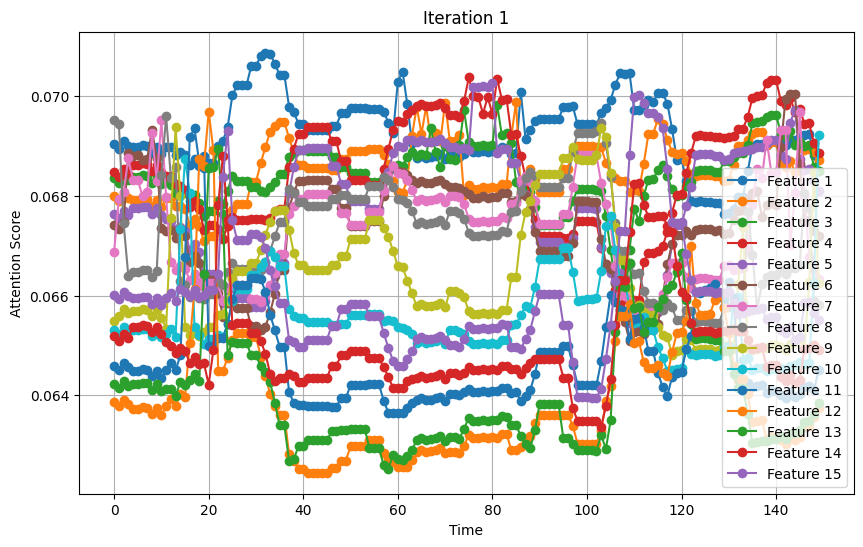

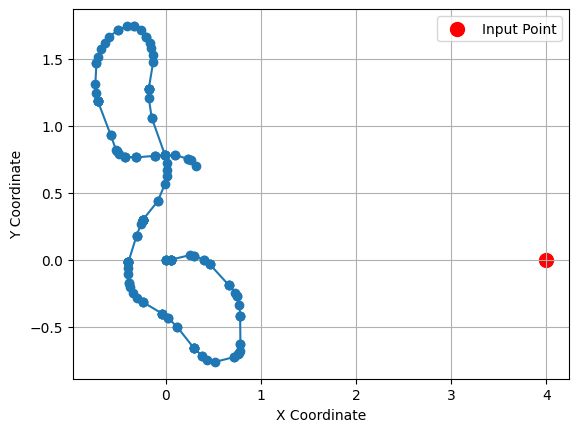

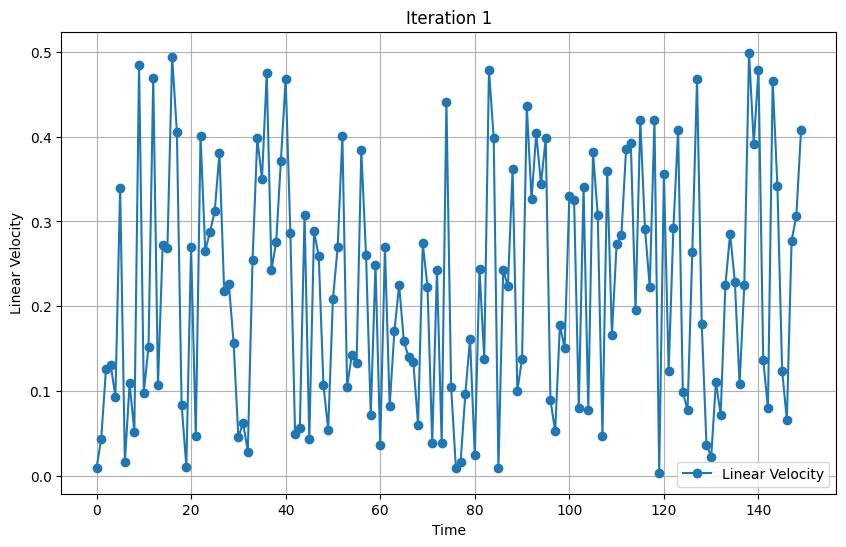

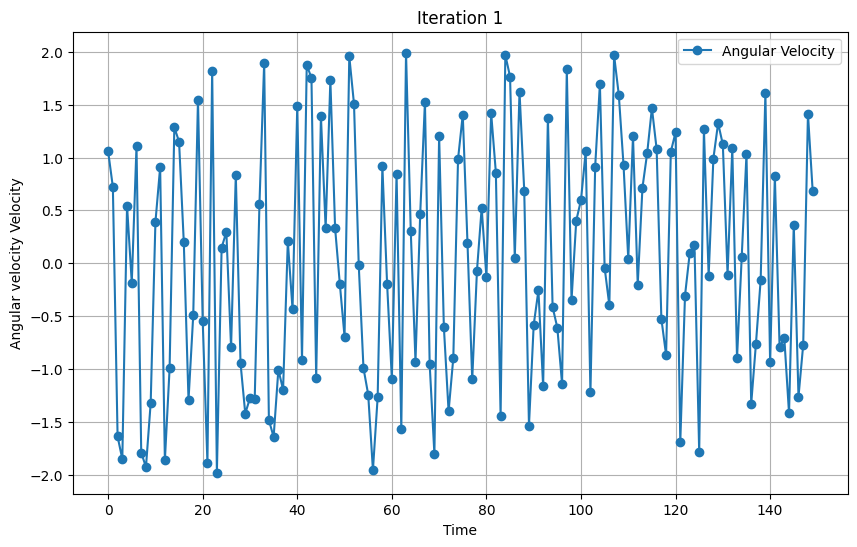

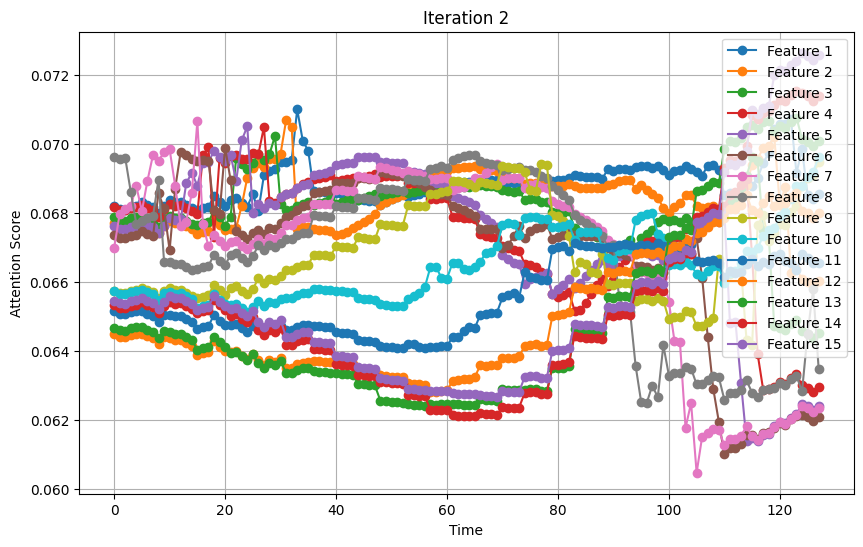

...

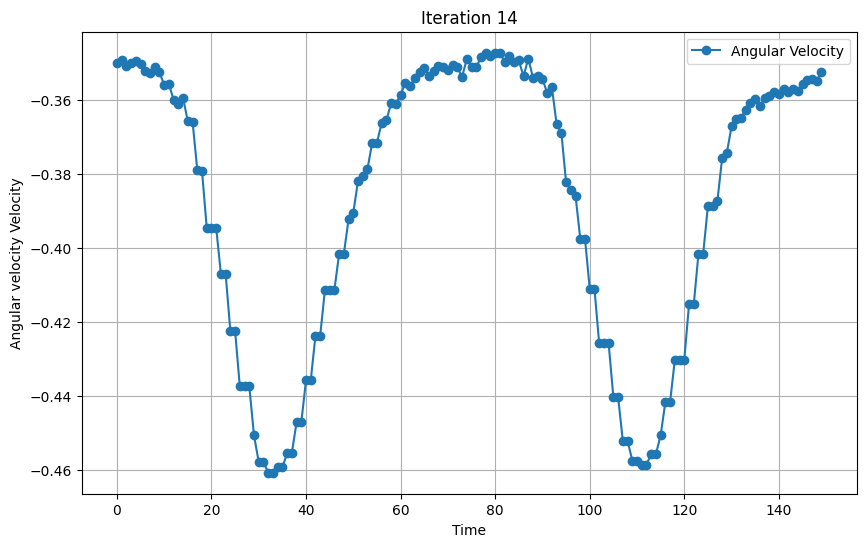

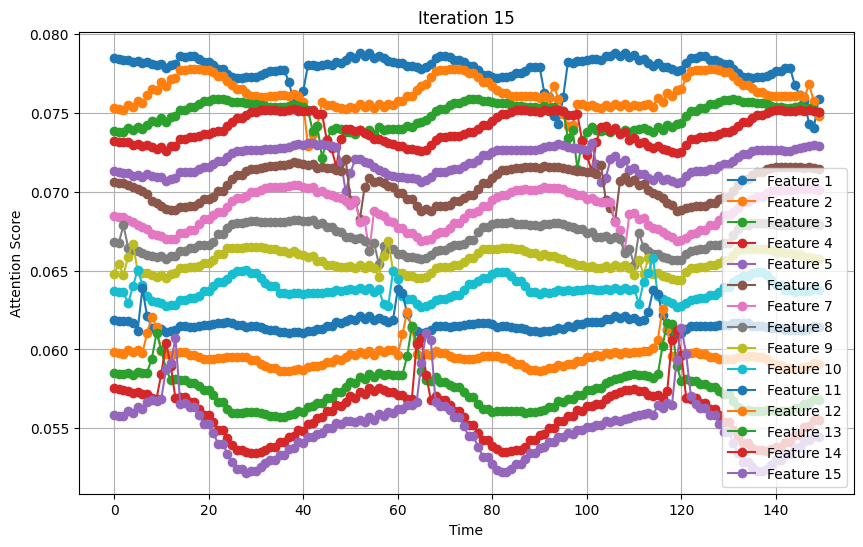

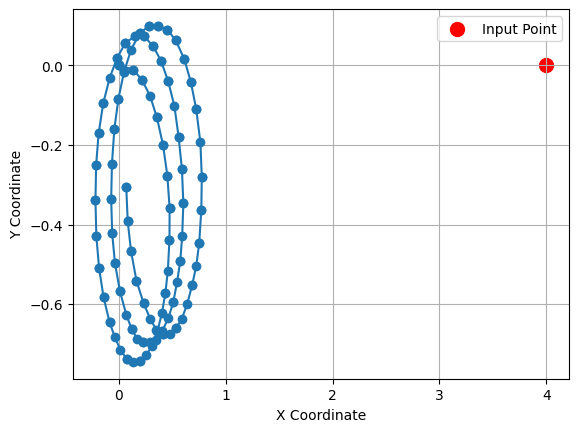

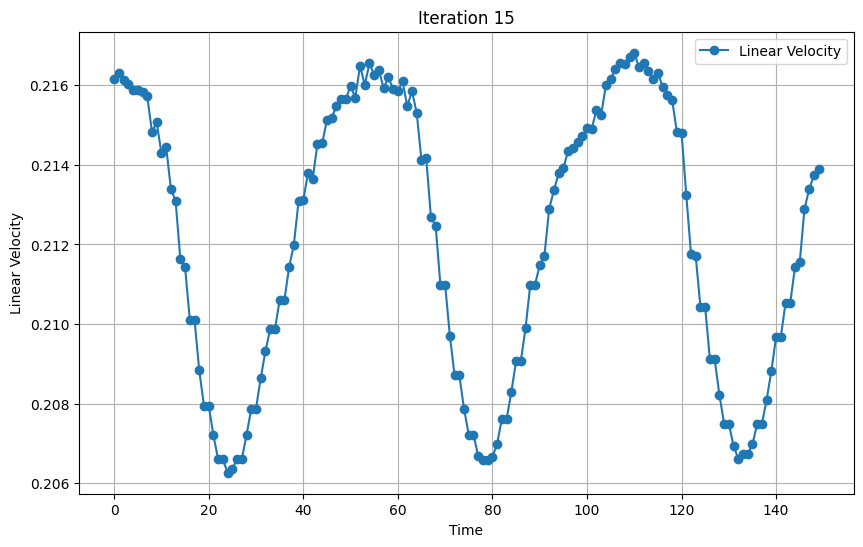

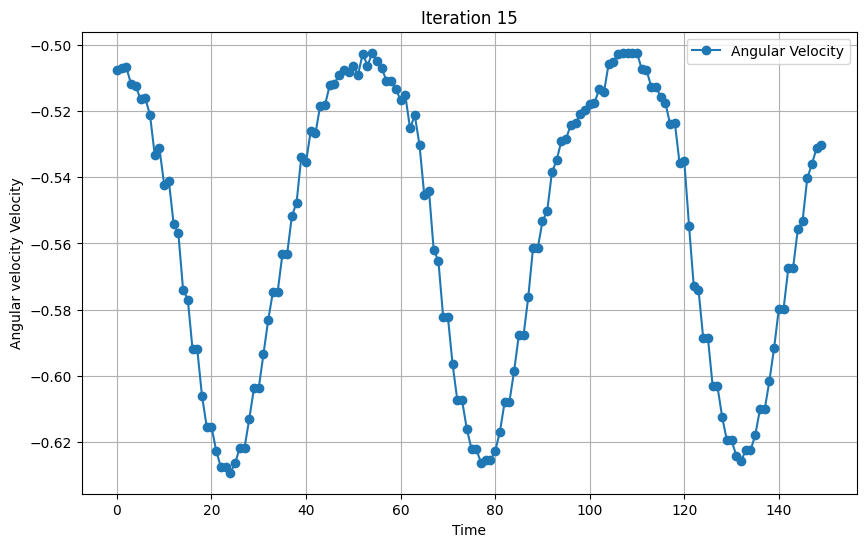

In [6]:
att_score = read_and_split_file(source_folder + "DDPG_attention_score.txt" )
lin_vel = read_velocity_file(source_folder + "DDPG_linear_vel.txt")
ang_vel = read_velocity_file(source_folder + "DDPG_angular_vel.txt")
x,y = read_position_coordinates(source_folder + "DDPG_position.txt")
#print dimension of values 

#print(len(values))
plot_blocks(att_score , lin_vel ,ang_vel , x , y , rospy.get_param('/Test_Goal/x'),rospy.get_param('/Test_Goal/y'))

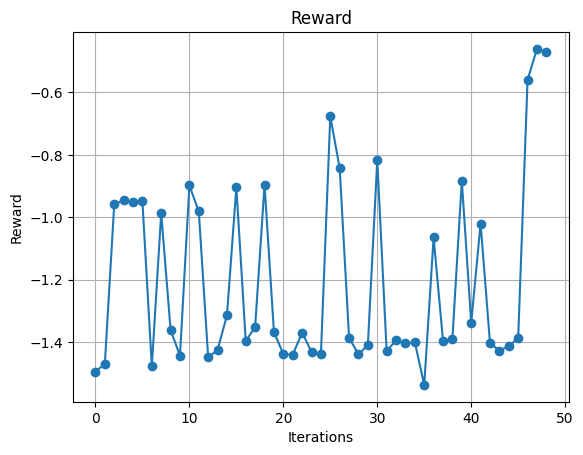

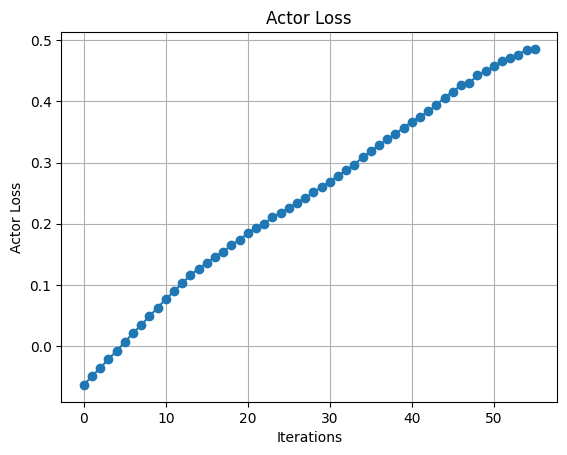

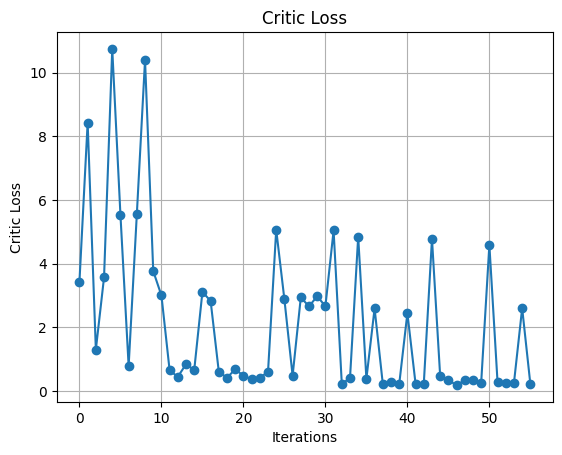

In [6]:
values = read_values_from_file(source_folder + "reward.txt" )
plot_values(values , "Reward" , "Iterations" , "Reward")

values = read_values_from_file(source_folder + "actor_loss.txt" )
plot_values(values , "Actor Loss" , "Iterations" , "Actor Loss")

values = read_values_from_file(source_folder + "critic_loss.txt" )
plot_values(values ,  "Critic Loss" , "Iterations" , "Critic Loss")

### TD3 ALGORITHM ###

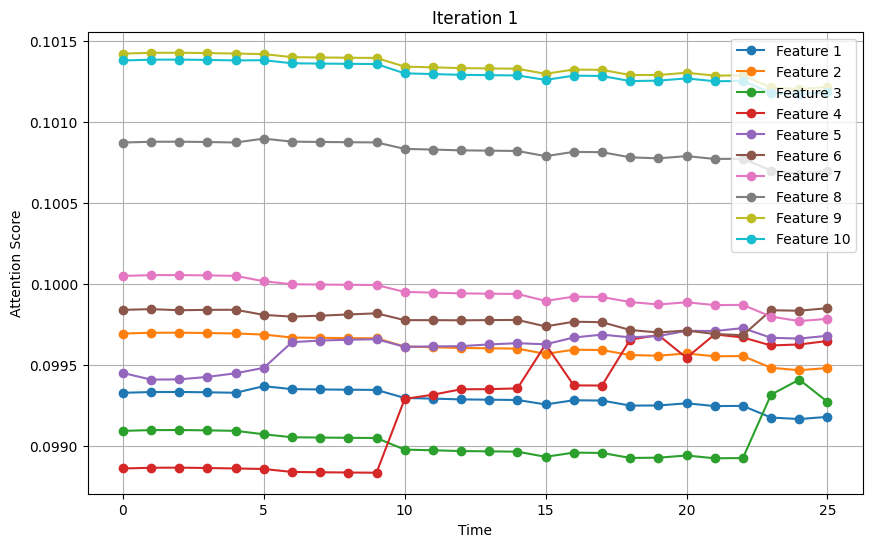

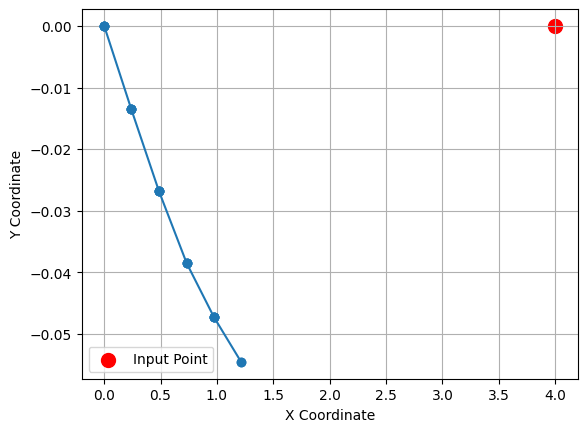

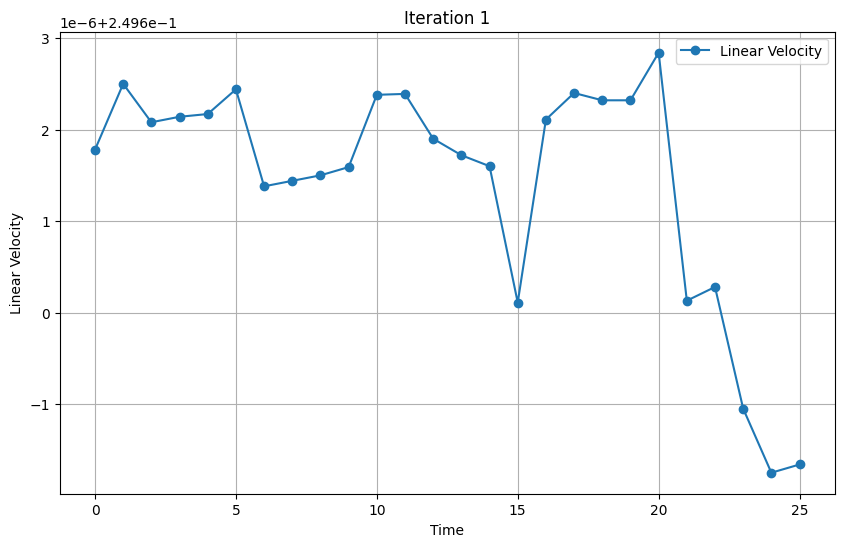

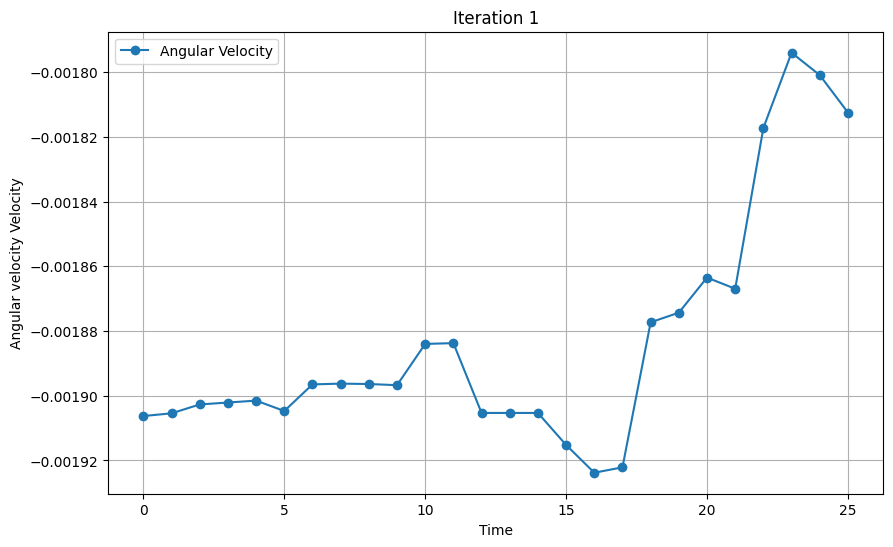

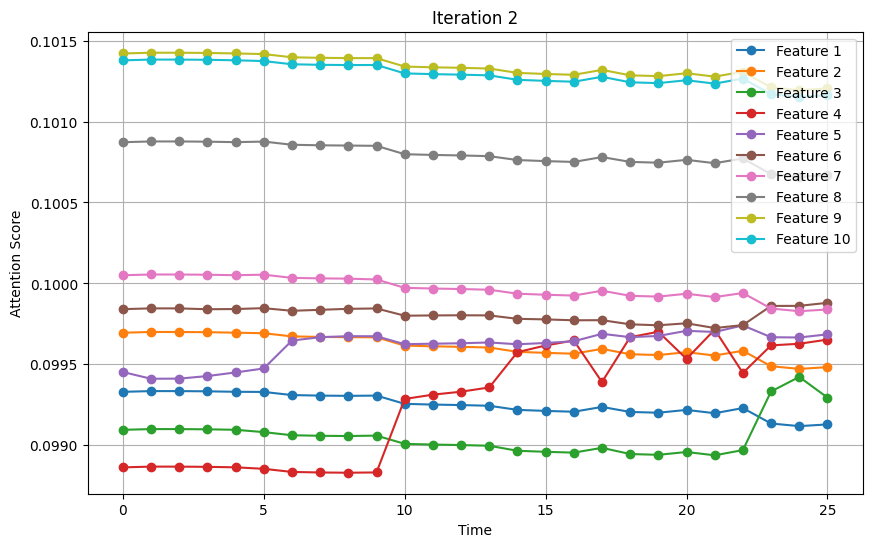

...

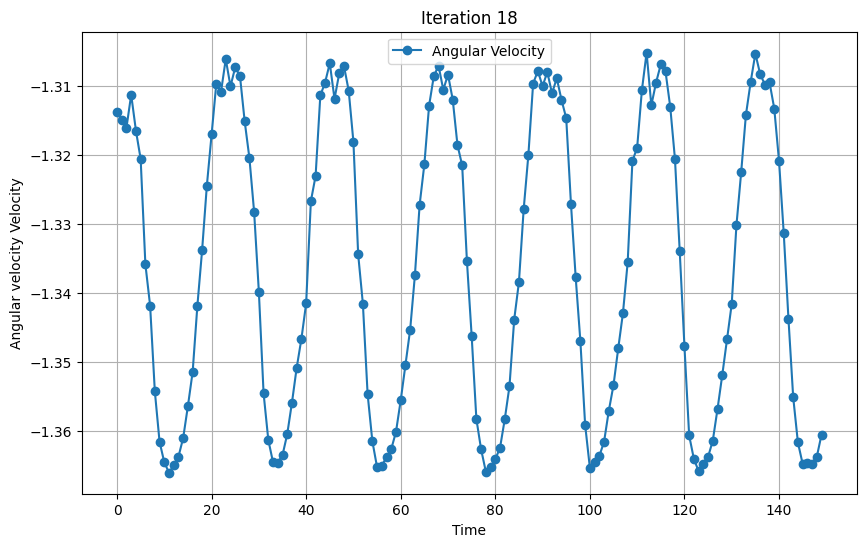

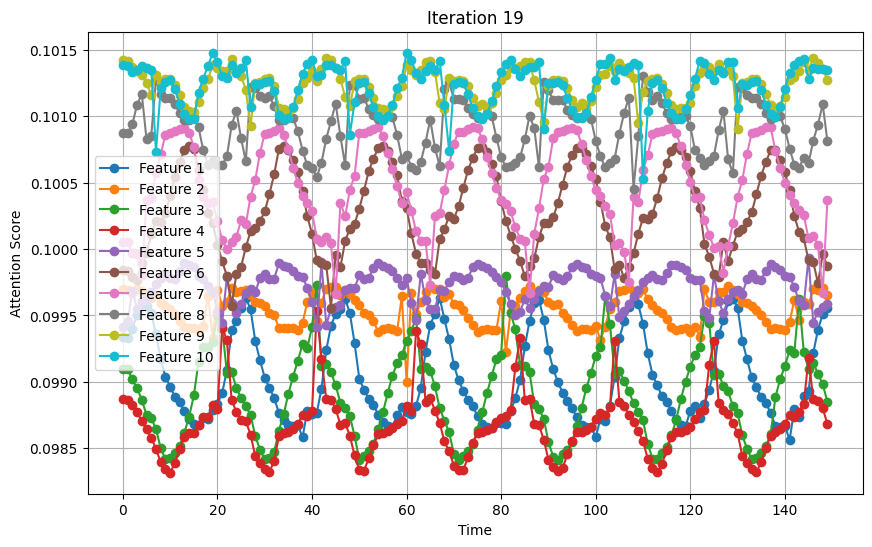

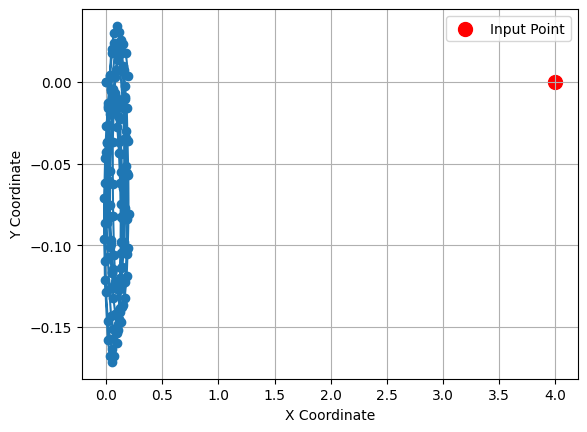

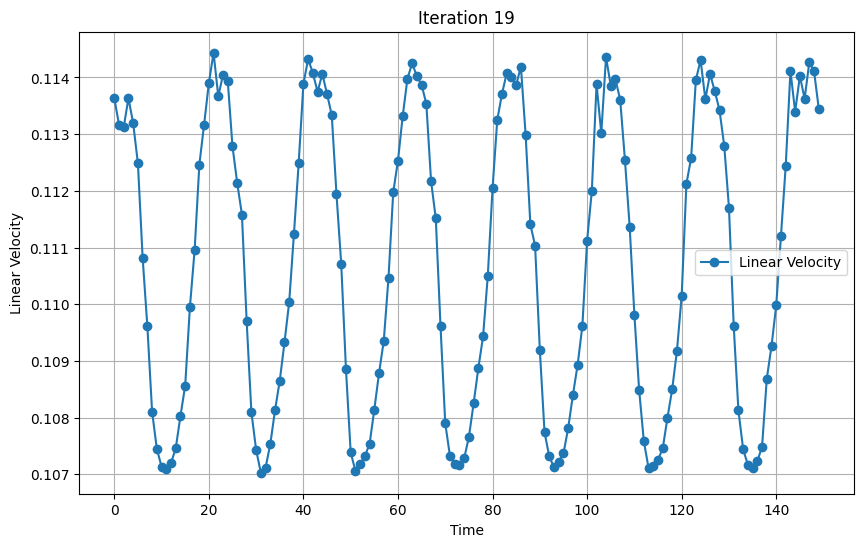

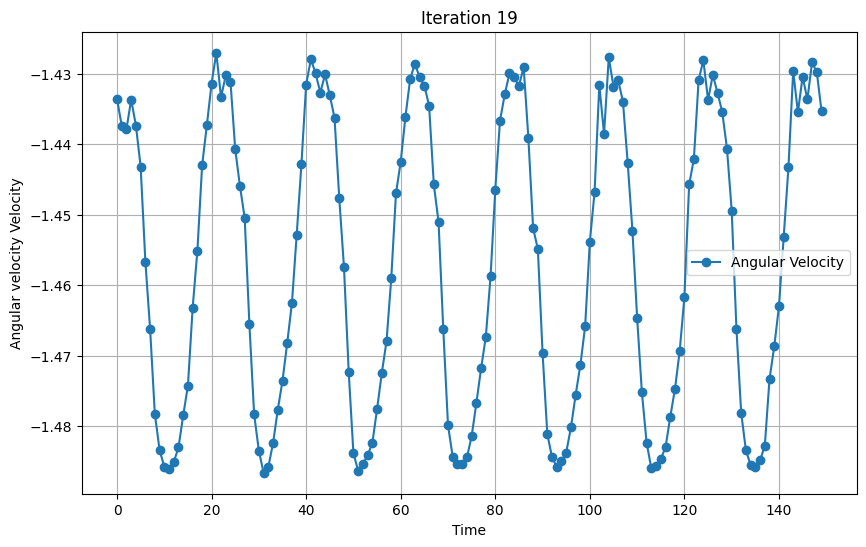

In [14]:
att_score = read_and_split_file(source_folder + "TD3_attention_score.txt" )
lin_vel = read_velocity_file(source_folder + "TD3_linear_vel.txt")
ang_vel = read_velocity_file(source_folder + "TD3_angular_vel.txt")
x,y = read_position_coordinates(source_folder + "TD3_position.txt")
#print dimension of values 

#print(len(values))
plot_blocks(att_score , lin_vel ,ang_vel , x , y , rospy.get_param('/Test_Goal/x'),rospy.get_param('/Test_Goal/y'))

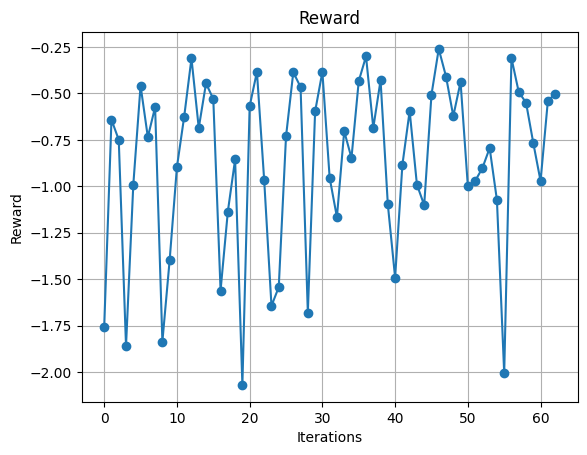

In [13]:
values = read_values_from_file(source_folder + "reward.txt" )
plot_values(values , "Reward" , "Iterations" , "Reward")

In [14]:
values = read_values_from_file(source_folder + "critic_diff.txt" )
plot_values(values ,  "Critic diff" , "Iterations" , "Critic diff")

FileNotFoundError: [Errno 2] No such file or directory: 'data/critic_diff.txt'

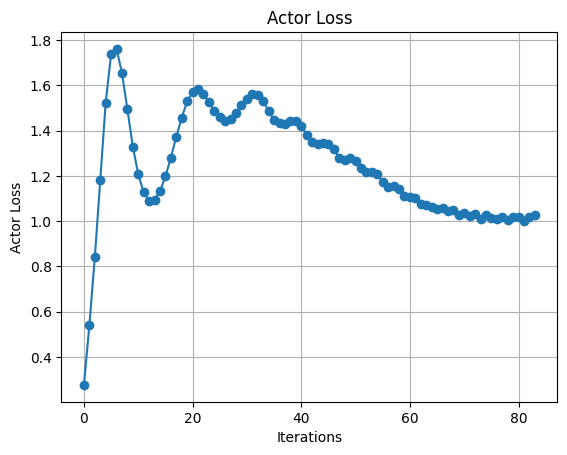

In [17]:
values = read_values_from_file(source_folder + "actor_loss.txt" )
plot_values(values ,  "Actor Loss" , "Iterations" , "Actor Loss")

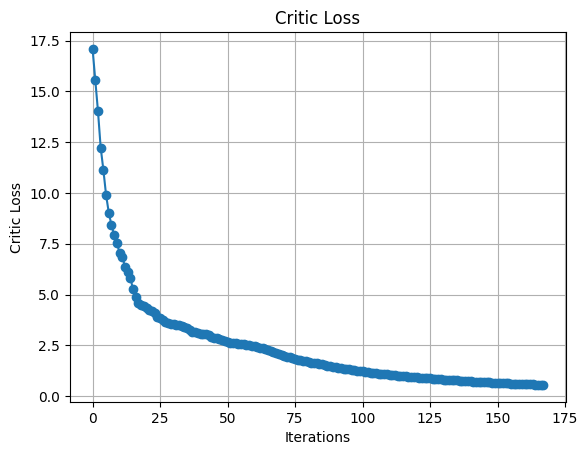

In [18]:
values = read_values_from_file(source_folder + "critic_loss.txt" )
plot_values(values ,  "Critic Loss" , "Iterations" , "Critic Loss")

### SAC ALGORITHM

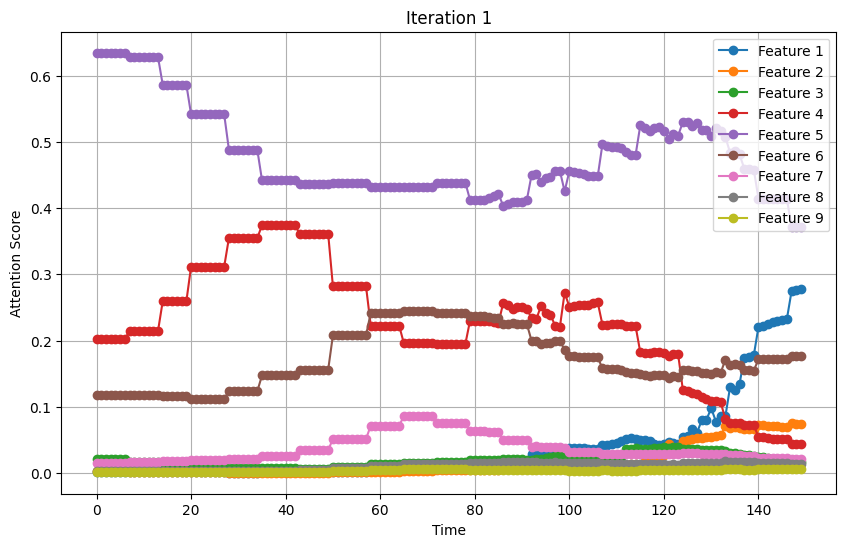

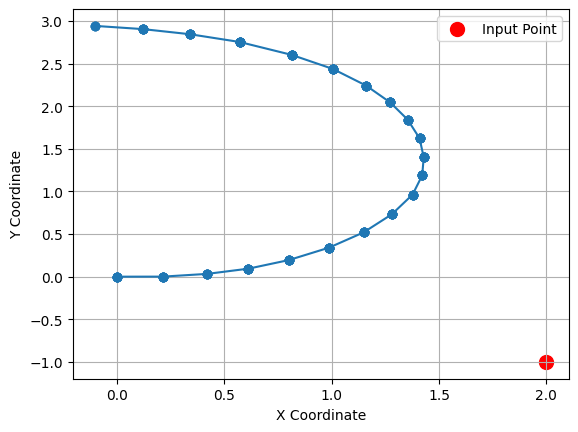

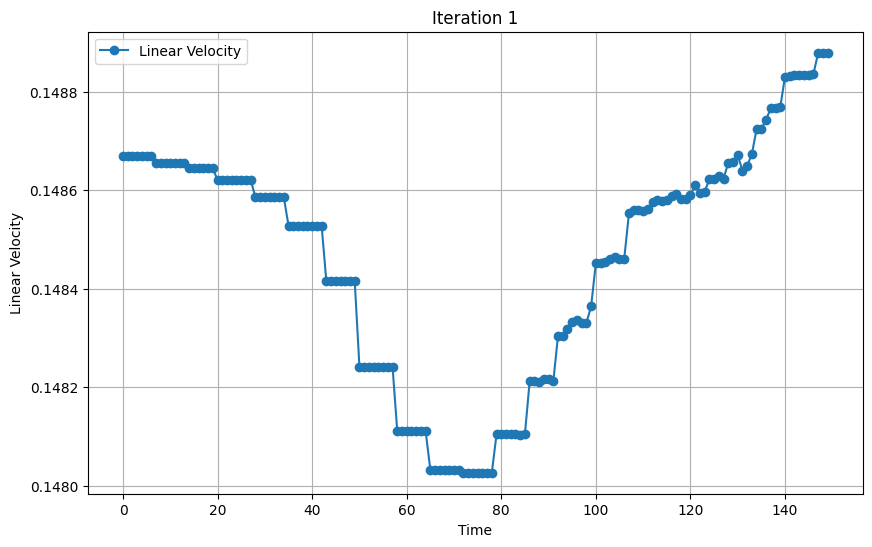

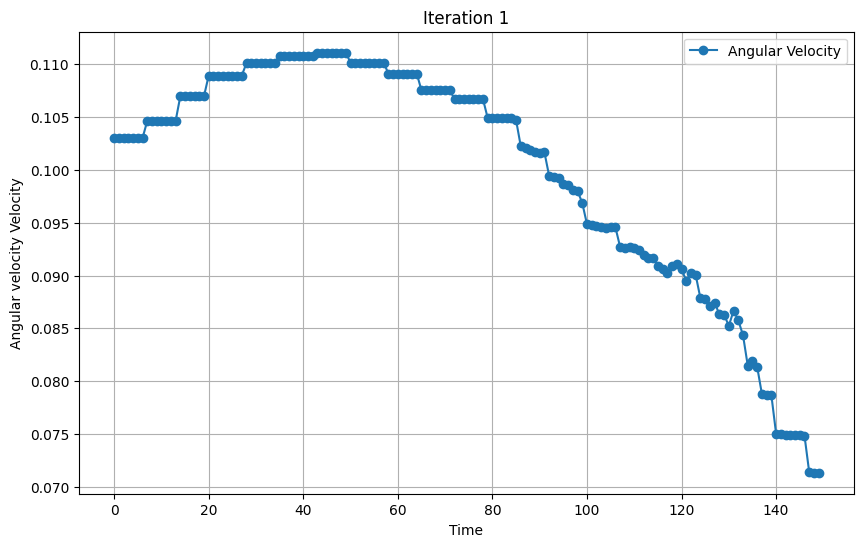

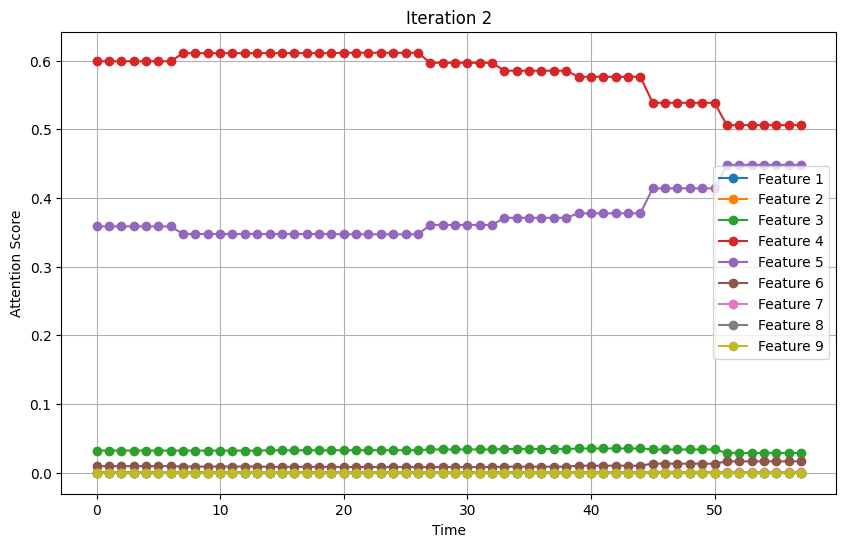

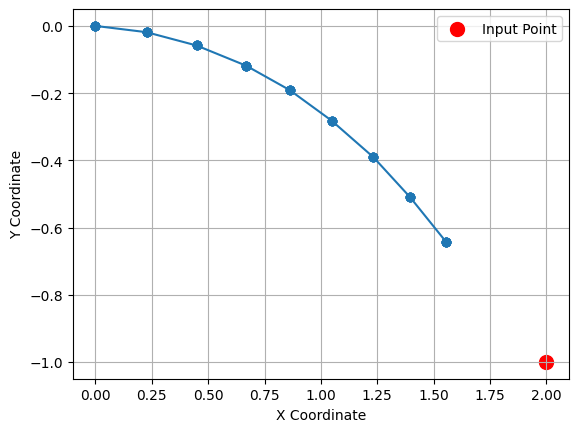

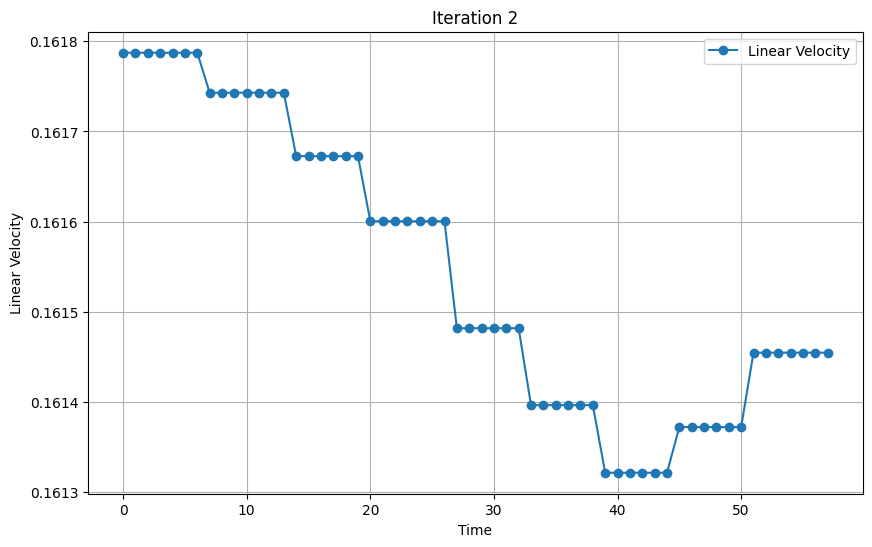

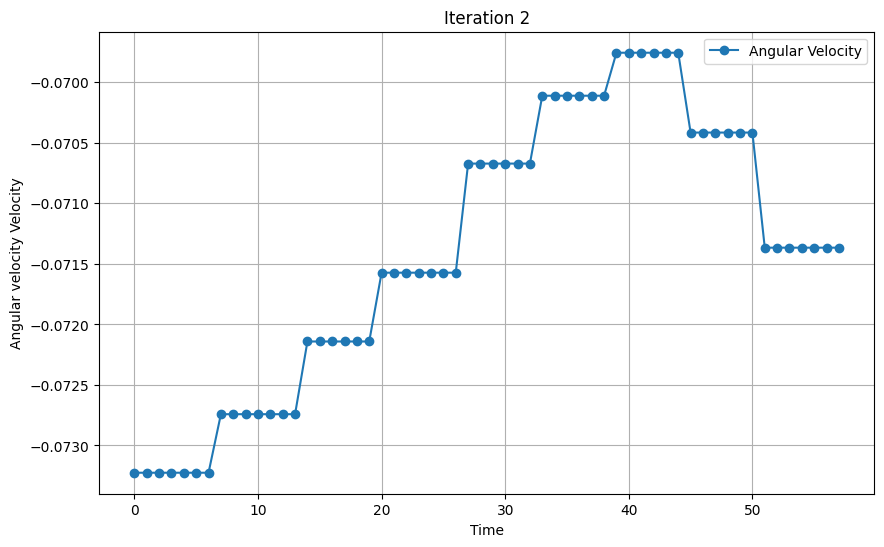

In [6]:
att_score = read_and_split_file(source_folder + "SAC_attention_score.txt" )
lin_vel = read_velocity_file(source_folder + "SAC_linear_vel.txt")
ang_vel = read_velocity_file(source_folder + "SAC_angular_vel.txt")
x,y = read_position_coordinates(source_folder + "SAC_position.txt")
#print dimension of values 

#print(len(values))
plot_blocks(att_score , lin_vel ,ang_vel , x , y , rospy.get_param('/Test_Goal/x'),rospy.get_param('/Test_Goal/y'))

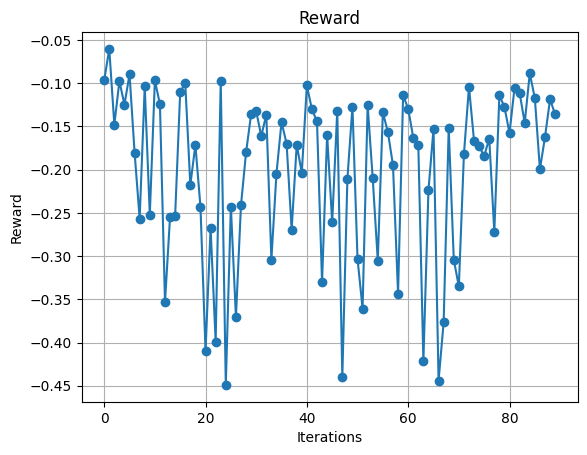

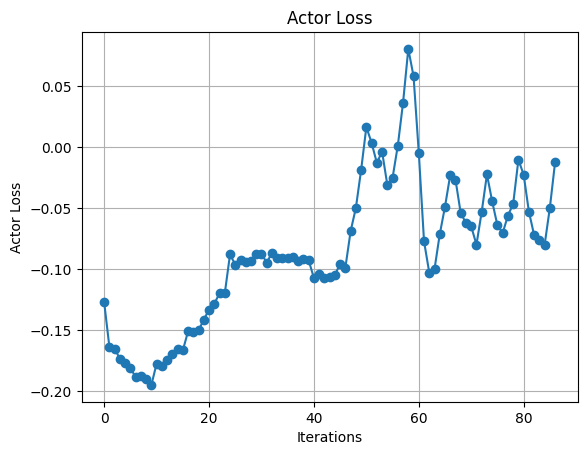

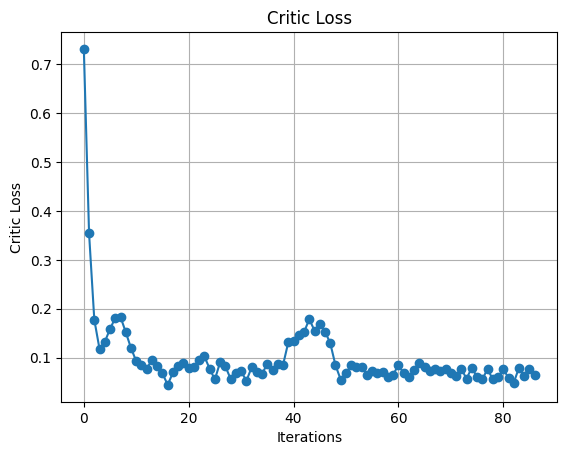

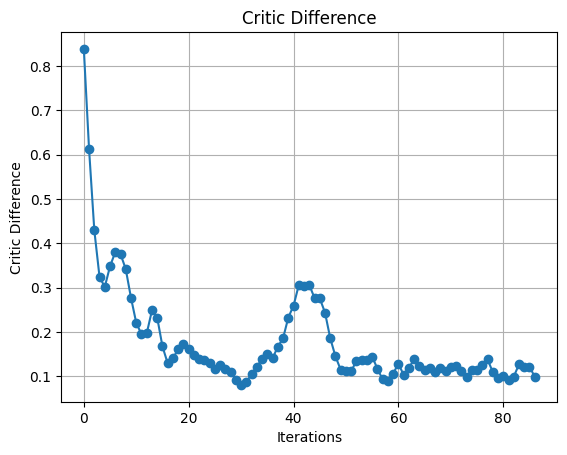

In [20]:
values = read_values_from_file(source_folder + "reward.txt" )
plot_values(values , "Reward" , "Iterations" , "Reward")

values = read_values_from_file(source_folder + "actor_loss.txt" )
plot_values(values , "Actor Loss" , "Iterations" , "Actor Loss")

values = read_values_from_file(source_folder + "critic_loss.txt" )
plot_values(values ,  "Critic Loss" , "Iterations" , "Critic Loss")

values = read_values_from_file(source_folder + "critic_diff.txt" )
plot_values(values ,  "Critic Difference" , "Iterations" , "Critic Difference")